<h1>Chapter 5 - Text Clustering and Topic Modeling</h1>
<i>Clustering documents using a wide variety of language models.</i>

<a href="https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961"><img src="https://img.shields.io/badge/Buy%20the%20Book!-grey?logo=amazon"></a>
<a href="https://www.oreilly.com/library/view/hands-on-large-language/9781098150952/"><img src="https://img.shields.io/badge/O'Reilly-white.svg?logo=data:image/svg%2bxml;base64,PHN2ZyB3aWR0aD0iMzQiIGhlaWdodD0iMjciIHZpZXdCb3g9IjAgMCAzNCAyNyIgZmlsbD0ibm9uZSIgeG1sbnM9Imh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIj4KPGNpcmNsZSBjeD0iMTMiIGN5PSIxNCIgcj0iMTEiIHN0cm9rZT0iI0Q0MDEwMSIgc3Ryb2tlLXdpZHRoPSI0Ii8+CjxjaXJjbGUgY3g9IjMwLjUiIGN5PSIzLjUiIHI9IjMuNSIgZmlsbD0iI0Q0MDEwMSIvPgo8L3N2Zz4K"></a>
<a href="https://github.com/HandsOnLLM/Hands-On-Large-Language-Models"><img src="https://img.shields.io/badge/GitHub%20Repository-black?logo=github"></a>
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/HandsOnLLM/Hands-On-Large-Language-Models/blob/main/chapter05/Chapter%205%20-%20Text%20Clustering%20and%20Topic%20Modeling.ipynb)

---

This notebook is for Chapter 5 of the [Hands-On Large Language Models](https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961) book by [Jay Alammar](https://www.linkedin.com/in/jalammar) and [Maarten Grootendorst](https://www.linkedin.com/in/mgrootendorst/).

---

<a href="https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961">
<img src="https://raw.githubusercontent.com/HandsOnLLM/Hands-On-Large-Language-Models/main/images/book_cover.png" width="350"/></a>


### [OPTIONAL] - Installing Packages on <img src="https://colab.google/static/images/icons/colab.png" width=100>

If you are viewing this notebook on Google Colab (or any other cloud vendor), you need to **uncomment and run** the following codeblock to install the dependencies for this chapter:

---

💡 **NOTE**: We will want to use a GPU to run the examples in this notebook. In Google Colab, go to
**Runtime > Change runtime type > Hardware accelerator > GPU > GPU type > T4**.

---


In [ ]:
# %%capture
# !pip install bertopic datasets openai datamapplot

# **ArXiv Articles: Computation and Language**

In [1]:
# Load data from huggingface
from datasets import load_dataset

dataset = load_dataset("maartengr/arxiv_nlp")["train"]


# Extract metadata
abstracts = dataset["Abstracts"]
titles = dataset["Titles"]

/opt/conda/envs/py_3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print(dataset)

print(len(abstracts), abstracts[0])
print(len(titles), titles[0])
print(dataset["Years"][0])
print(dataset["Categories"][0])

Dataset({
    features: ['Titles', 'Abstracts', 'Years', 'Categories'],
    num_rows: 44949
})
44949   In this paper Arabic was investigated from the speech recognition problem
point of view. We propose a novel approach to build an Arabic Automated Speech
Recognition System (ASR). This system is based on the open source CMU Sphinx-4,
from the Carnegie Mellon University. CMU Sphinx is a large-vocabulary;
speaker-independent, continuous speech recognition system based on discrete
Hidden Markov Models (HMMs). We build a model using utilities from the
OpenSource CMU Sphinx. We will demonstrate the possible adaptability of this
system to Arabic voice recognition.

44949 Introduction to Arabic Speech Recognition Using CMUSphinx System
2007
Computation and Language


# **A Common Pipeline for Text Clustering**

## **1. Embedding Documents**

In [3]:
from sentence_transformers import SentenceTransformer

# Create an embedding for each abstract
embedding_model = SentenceTransformer("thenlper/gte-small")
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

Batches: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1405/1405 [01:44<00:00, 13.44it/s]


In [4]:
# Check the dimensions of the resulting embeddings
embeddings.shape

(44949, 384)

## **2. Reducing the Dimensionality of Embeddings**

In [5]:
from umap import UMAP

# We reduce the input embeddings from 384 dimenions to 5 dimenions
umap_model = UMAP(n_components=5, min_dist=0.0, metric="cosine", random_state=42)
reduced_embeddings = umap_model.fit_transform(embeddings)

/opt/conda/envs/py_3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/conda/envs/py_3.10/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/conda/envs/py_3.10/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


In [6]:
print(type(reduced_embeddings), reduced_embeddings.shape)

<class 'numpy.ndarray'> (44949, 5)


## **3. Cluster the Reduced Embeddings**

In [7]:
from hdbscan import HDBSCAN

# We fit the model and extract the clusters
hdbscan_model = HDBSCAN(
    min_cluster_size=50, metric="euclidean", cluster_selection_method="eom"
).fit(reduced_embeddings)
clusters = hdbscan_model.labels_

# How many clusters did we generate?
len(set(clusters))

/opt/conda/envs/py_3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/conda/envs/py_3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set

151

## **Inspecting the Clusters**

Manually inspect the first three documents in cluster 0:

In [19]:
import numpy as np

print(type(clusters), len(clusters), clusters[:10])

# Print first three documents in cluster 0
cluster = 0
for index in np.where(clusters == cluster)[0][:3]:
    print(abstracts[index][:300] + "... \n")

<class 'numpy.ndarray'> 44949 [ -1  -1  -1  -1  76 115 115  -1 131  -1]
  This works aims to design a statistical machine translation from English text
to American Sign Language (ASL). The system is based on Moses tool with some
modifications and the results are synthesized through a 3D avatar for
interpretation. First, we translate the input text to gloss, a written fo... 

  Researches on signed languages still strongly dissociate lin- guistic issues
related on phonological and phonetic aspects, and gesture studies for
recognition and synthesis purposes. This paper focuses on the imbrication of
motion and meaning for the analysis, synthesis and evaluation of sign lang... 

  Modern computational linguistic software cannot produce important aspects of
sign language translation. Using some researches we deduce that the majority of
automatic sign language translation systems ignore many aspects when they
generate animation; therefore the interpretation lost the truth inf... 



Next, we reduce our embeddings to 2-dimensions so that we can plot them and get a rough understanding of the generated clusters.

In [20]:
import pandas as pd

# Reduce 384-dimensional embeddings to 2 dimensions for easier visualization
reduced_embeddings = UMAP(
    n_components=2, min_dist=0.0, metric="cosine", random_state=42
).fit_transform(embeddings)

# Create dataframe
df = pd.DataFrame(reduced_embeddings, columns=["x", "y"])
df["title"] = titles
df["cluster"] = [str(c) for c in clusters]

# Select outliers and non-outliers (clusters)
clusters_df = df.loc[df.cluster != "-1", :]
outliers_df = df.loc[df.cluster == "-1", :]

/opt/conda/envs/py_3.10/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/conda/envs/py_3.10/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### Static Plot

In [ ]:
import matplotlib.pyplot as plt

# Plot outliers and non-outliers seperately
plt.scatter(outliers_df.x, outliers_df.y, alpha=0.05, s=2, c="grey")
plt.scatter(
    clusters_df.x,
    clusters_df.y,
    c=clusters_df.cluster.astype(int),
    alpha=0.6,
    s=2,
    cmap="tab20b",
)
plt.axis("off")
# plt.savefig("matplotlib.png", dpi=300)  # Uncomment to save the graph as a .png

ImportError: Matplotlib requires numpy>=1.23; you have 1.22.4

# From Text Clustering to Topic Modeling

## **BERTopic: A Modular Topic Modeling Framework**

In [8]:
from bertopic import BERTopic

# Train our model with our previously defined models
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    verbose=True,
).fit(abstracts, embeddings)

2025-01-04 17:22:53,461 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-01-04 17:23:15,719 - BERTopic - Dimensionality - Completed ✓
2025-01-04 17:23:15,720 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-01-04 17:23:16,533 - BERTopic - Cluster - Completed ✓
2025-01-04 17:23:16,539 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-01-04 17:23:18,918 - BERTopic - Representation - Completed ✓


Now, let's start exploring the topics that we got by running the code above.

In [26]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,14490,-1_the_of_and_to,"[the, of, and, to, in, we, language, for, that...",[ Unsupervised Machine Learning techniques ha...
1,0,2248,0_question_questions_qa_answer,"[question, questions, qa, answer, answering, a...",[ Multilingual question answering tasks typic...
2,1,2089,1_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, spea...",[ Recent advances in text-to-speech (TTS) led...
3,2,1136,2_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, notes...",[ Background : Knowledge is evolving over tim...
4,3,892,3_summarization_summaries_summary_abstractive,"[summarization, summaries, summary, abstractiv...",[ Neural network-based approaches have become...
...,...,...,...,...,...
148,147,53,147_sentence_sts_embeddings_similarity,"[sentence, sts, embeddings, similarity, embedd...",[ BERT is inefficient for sentence-pair tasks...
149,148,53,148_coherence_discourse_text_paragraph,"[coherence, discourse, text, paragraph, cohesi...",[ While there has been significant progress t...
150,149,53,149_emoji_emojis_emoticons_sentiment,"[emoji, emojis, emoticons, sentiment, social, ...",[ The frequent use of Emojis on social media ...
151,150,53,150_counseling_mental_therapy_health,"[counseling, mental, therapy, health, psychoth...",[ Mental health care poses an increasingly se...


Hundreds of topics were generated using the default model! To get the top 10 keywords per topic as well as their c-TF-IDF weights, we can use the `get_topic()` function:

In [9]:
topic_model.get_topic(1)

[('speech', 0.029238152959490733),
 ('asr', 0.019687916737751072),
 ('recognition', 0.013987496575717814),
 ('end', 0.010622763693505123),
 ('acoustic', 0.009971978826899363),
 ('speaker', 0.007193578884683584),
 ('audio', 0.006844840015680125),
 ('wer', 0.006674690009450849),
 ('error', 0.006634354260739565),
 ('the', 0.006539652461417017)]

We can use the `find_topics()` function to search for specific topics based on a search term. Let’s search for a topic about topic modeling:

In [10]:
topic_model.find_topics("topic modeling")

([22, -1, 51, 2, 31], [0.9545265, 0.9118878, 0.90698624, 0.9050453, 0.9047916])

It returns that topic 22 has a relatively high similarity (0.95) with our search term. If we then inspect the topic, we can see that it is indeed a topic about topic modeling:

In [11]:
topic_model.get_topic(23)

[('law', 0.021440460709863367),
 ('zipf', 0.017923428622269783),
 ('frequency', 0.01588645746860871),
 ('words', 0.011440721145265068),
 ('of', 0.0098890979901815),
 ('word', 0.009239010074139749),
 ('texts', 0.008849192071904),
 ('length', 0.008752579148881525),
 ('rank', 0.008710751815812242),
 ('linguistic', 0.008408689336728217)]

That seems like a topic that is, in part, characterized by the classic LDA technique. Let's see if the BERTopic paper was also assigned to topic 22:

In [32]:
topic_model.topics_[
    titles.index("BERTopic: Neural topic modeling with a class-based TF-IDF procedure")
]

23

It is! We expected it might be because there are non-LDA specific words in the topic describtion such as "clustering" and "topic".

### **Visualizations**

**Visualize Documents**

In [33]:
# Visualize topics and documents
fig = topic_model.visualize_documents(
    titles, reduced_embeddings=reduced_embeddings, width=1200, hide_annotations=True
)

# Update fonts of legend for easier visualization
fig.update_layout(font=dict(size=16))

In [39]:
# Visualize barchart with ranked keywords
topic_model.visualize_barchart()

# Visualize relationships between topics
# topic_model.visualize_heatmap(n_clusters=30)

# Visualize the potential hierarchical structure of topics
# topic_model.visualize_hierarchy()

## **Representation Models**

In these examples that follow, we will update our topic representations **after** having trained our model. This allows for quick iteration. If, however, you want to use a representation model at the start of training, you will need to run it as follows:

```python
from bertopic.representation import KeyBERTInspired
from bertopic import BERTopic

# Create your representation model
representation_model = KeyBERTInspired()

# Use the representation model in BERTopic on top of the default pipeline
topic_model = BERTopic(representation_model=representation_model)
```

To use the representation models, we are first going to duplicate our topic model such that easily show the differences between a model with and without representation model.

In [12]:
# Save original representations
from copy import deepcopy

original_topics = deepcopy(topic_model.topic_representations_)

In [13]:
def topic_differences(model, original_topics, nr_topics=5):
    """Show the differences in topic representations between two models"""
    df = pd.DataFrame(columns=["Topic", "Original", "Updated"])
    for topic in range(nr_topics):

        # Extract top 5 words per topic per model
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])
        df.loc[len(df)] = [topic, og_words, new_words]

    return df

### KeyBERTInspired

In [42]:
from bertopic.representation import KeyBERTInspired

# Update our topic representations using KeyBERTInspired
representation_model = KeyBERTInspired()
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | questions | qa | answer | answering,answering | retrieval | questions | comprehens...
1,1,speech | asr | recognition | end | acoustic,phonetic | language | voice | audio | speech
2,2,medical | clinical | biomedical | patient | notes,nlp | text | ehr | clinical | bert
3,3,summarization | summaries | summary | abstract...,summarization | summarizers | summaries | summ...
4,4,translation | nmt | machine | neural | bleu,translation | multilingual | translate | trans...


### Maximal Marginal Relevance

In [43]:
from bertopic.representation import MaximalMarginalRelevance

# Update our topic representations to MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.5)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | questions | qa | answer | answering,questions | retrieval | comprehension | knowle...
1,1,speech | asr | recognition | end | acoustic,speech | asr | automatic | model | training
2,2,medical | clinical | biomedical | patient | notes,clinical | domain | entity | disease | extraction
3,3,summarization | summaries | summary | abstract...,summarization | document | extractive | rouge ...
4,4,translation | nmt | machine | neural | bleu,translation | nmt | neural | bleu | parallel


## Text Generation



### Flan-T5

In [14]:
from transformers import pipeline
from bertopic.representation import TextGeneration

prompt = """I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the documents and keywords, what is this topic about?"""

# Update our topic representations using Flan-T5
generator = pipeline("text-generation", model="meta-llama/Llama-3.2-3B-Instruct")
representation_model = TextGeneration(
    generator, prompt=prompt, doc_length=50, tokenizer="whitespace"
)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

Loading checkpoint shards: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.54s/it]
Device set to use cuda:0
  7%|████████                                                                                                                 | 10/151 [00:25<05:52,  2.50s/it]You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 151/151 [06:16<00:00,  2.49s/it]


NameError: name 'pd' is not defined

In [16]:
import pandas as pd

# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | qa | questions | answer | answering,\n\nThis topic is about natural language proc...
1,1,speech | asr | recognition | end | acoustic,This topic is about the topic of speech recog...
2,2,medical | clinical | biomedical | patient | notes,\n\nThis topic is about the use of natural la...
3,3,translation | nmt | machine | neural | bleu,\n\nThis topic appears to be about the challe...
4,4,summarization | summaries | summary | abstract...,\n\nThis topic is about summarization of text...


### OpenAI

In [ ]:
import openai
from bertopic.representation import OpenAI

prompt = """
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short topic label in the following format:
topic: <short topic label>
"""

# Update our topic representations using GPT-3.5
client = openai.OpenAI(api_key="YOUR_KEY_HERE")
representation_model = OpenAI(
    client, model="gpt-3.5-turbo", exponential_backoff=True, chat=True, prompt=prompt
)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

100%|██████████| 156/156 [02:13<00:00,  1.17it/s]


,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,Leveraging External Data for Improving Low-Res...
1,1,medical | clinical | biomedical | patient | he...,Improved Representation Learning for Biomedica...
2,2,sentiment | aspect | analysis | reviews | opinion,"""Advancements in Aspect-Based Sentiment Analys..."
3,3,translation | nmt | machine | neural | bleu,Neural Machine Translation Enhancements
4,4,summarization | summaries | summary | abstract...,Document Summarization Techniques


In [45]:
# Visualize topics and documents
fig = topic_model.visualize_document_datamap(
    titles,
    topics=list(range(20)),
    reduced_embeddings=reduced_embeddings,
    width=1200,
    label_font_size=11,
    label_wrap_width=20,
    use_medoids=True,
)
plt.savefig("datamapplot.png", dpi=300)

NameError: name 'datamapplot' is not defined


## **BONUS**: Word Cloud

Make sure to pip install `wordcloud` first in order to follow this bonus:


First, we need to make sure that each topic is described by a bit more words than just 10 as that would make for a much more interesting wordcloud.

In [ ]:
topic_model.update_topics(abstracts, top_n_words=500)

Then, we can run the following code to generate the wordcloud for our topic modeling topic:

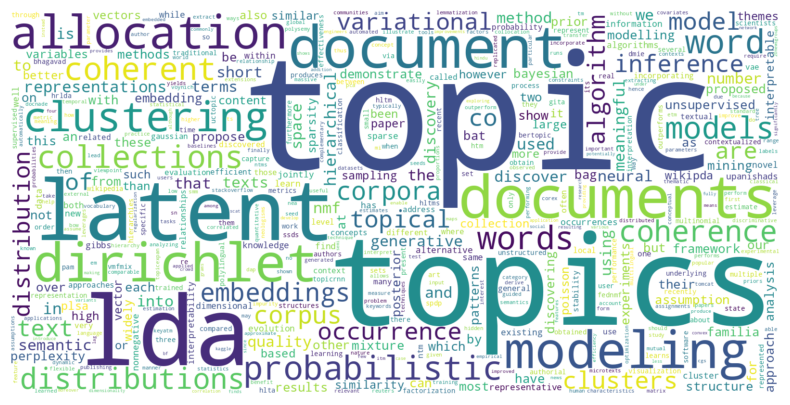

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt


def create_wordcloud(model, topic):
    plt.figure(figsize=(10, 5))
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000, width=1600, height=800)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()


# Show wordcloud
create_wordcloud(topic_model, topic=17)